#### Twitter Sentimet Analysis for Twitter Flu Symptoms Data
           - By Kirti Kamerkar, Austin Capital Data,Austin,Tx

- Creating twitter developer login
- Import the required libraries to extract data from twitter and for data preprocessing.
- Getting Twitter API keys
- Connecting to Twitter Streaming API and downloading data
- Extact the data and write it to a CSV file
- Cleaning the Data
- Exploratory Data Analysis
- Dashboard Design with tableau
  - Overview of Tableau




#### What is sentiment analysis? 
- Sentiment Analysis is the process of ‘computationally’ determining whether a piece of writing is positive, negative or neutral. It’s also known as opinion mining, deriving the opinion or attitude of a speaker. 

##### Create twitter developer login:
- Login into twitter account with valid email,password and phone number.If you didn't add your phone number at the time of creating account,you will need to update with valid phone number.
- Once login is done ,than move to https://apps.twitter.com/ and log in with your twitter credentials.
- Fill and submit the form and wait for verification email from twitter. 

##### Importing Libraries to download and analyze twitter data

 - **Tweepy** is a python client for the official Twitter API. Basically, it helps to access Twitter via Authentication. 
 - **TextBlob** is  a python library for processing textual data. It is built on top of the NLTK library and helps to conveniently perform a lot of NLP(Natural Language Processing)tasks.
 - **NLTK** provides easy-to-use interfaces to over 50 corpora and lexical resources such as WordNet, along with a suite of text processing libraries for classification, tokenization, stemming, tagging, parsing, and semantic reasoning, wrappers for industrial-strength NLP libraries, and an active discussion forum.

In [1]:
#Importing Libraries
import tweepy
from textblob import TextBlob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from wordcloud import WordCloud
import json
from collections import Counter
from tweepy import OAuthHandler
import csv
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
import string # Inbuilt string library
import emot
from emot.emo_unicode import UNICODE_EMOJI # For emojis
from nltk.corpus import words
nltk.download('words')
# Natural Language Processing Toolkit
from nltk.corpus import stopwords, words # get stopwords from NLTK library & get all words in english language
from nltk.tokenize import word_tokenize # to create word tokens
# from nltk.stem import PorterStemmer (I played around with Stemmer and decided to use Lemmatizer instead)
from nltk.stem import WordNetLemmatizer # to reduce words to orginal form
from nltk import pos_tag # For Parts of Speech tagging
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('averaged_perceptron_tagger')
nltk.download('omw-1.4')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/kirtikamerkar/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/kirtikamerkar/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package words to
[nltk_data]     /Users/kirtikamerkar/nltk_data...
[nltk_data]   Package words is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/kirtikamerkar/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/kirtikamerkar/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/kirtikamerkar/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     

True

In [2]:
consumer_key = 'twI3B0GuFxkAY5Y8EggYuH1MW'
consumer_secret = 'MRnoOyoGOgoXAyd26Rwm2cZloVBT63MhZr5ZyvT06koxPDlIhV'
access_token = '720169710-4hstZM04S6DMKm1rr1y4Cy9TWvgTvu29LUKzbUT6'
access_secret = 'v23joaXipB0ORm5JCEEpR8xSOEwJWkNAXidpHRlElm3hY'
auth = OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_secret)
 
api = tweepy.API(auth)
api = tweepy.API(auth,wait_on_rate_limit=True)
api.verify_credentials()


User(_api=<tweepy.api.API object at 0x7fbf4cc4ca60>, _json={'id': 720169710, 'id_str': '720169710', 'name': 'Gunnar Kleemann', 'screen_name': 'GunnarKleemann', 'location': 'Princeton, NJ', 'description': 'Biologist, tech junkie, artistic tinkerer', 'url': 'http://t.co/3ORHhV7Byw', 'entities': {'url': {'urls': [{'url': 'http://t.co/3ORHhV7Byw', 'expanded_url': 'http://www.gunnarkleemann.net', 'display_url': 'gunnarkleemann.net', 'indices': [0, 22]}]}, 'description': {'urls': []}}, 'protected': False, 'followers_count': 52, 'friends_count': 134, 'listed_count': 4, 'created_at': 'Fri Jul 27 13:37:49 +0000 2012', 'favourites_count': 5, 'utc_offset': None, 'time_zone': None, 'geo_enabled': False, 'verified': False, 'statuses_count': 34, 'lang': None, 'status': {'created_at': 'Sun Jan 05 23:24:23 +0000 2020', 'id': 1213964491987341312, 'id_str': '1213964491987341312', 'text': 'I published “Thanks for writing this Tim.” on @Medium https://t.co/w7Hv7KyM5O', 'truncated': False, 'entities': {'ha

#### Mining Data for Analysis:

- collect the data for flu,headache,diarrhea,stuffy/itchy nose/throat for 3/4 days
- create dataset with ['tweet_id', 'full_text'/'text','favorite_count','retweet_count','created_at','location'])
- append all data together
- clean it
- analyze it

### Defining function to collect tweeter data Using Tweepy:
- Collecting Tweets from twitter using tweepy.Cursor() function providing api.search_tweets,query(key word that need to search) and maximum number of tweet.
- Creating dataframe to perform sentiment Analysis.To create dataframe,we will first fetch tweets from the twitter API and isolate the json part of each tweepy status object that we have downloaded and we add them all into a list.
- We write this list into a txt file.
- Created column list according to requirements from twitter data.
- Using list of created field my_demo_list and column names created pandas dataframe and saved as csv file with append mode so that after every search we can store the data in csv file.option also, you can store this data into any database.

In [3]:
def getTweet(query,max_tweets):
 #Searching tweets with api.search_tweets   
    searched_tweets= [status for status in tweepy.Cursor(api.search_tweets, q=query,).items(max_tweets)]
#Creating Dataframe of Tweets
#Cleaning searched tweets and converting into Dataframe
#Fetch tweets from the twitter API using the following loop:
    
    my_list_of_dicts = []
#Isolate the json part of each tweepy status object that we have downloaded and we add them all into a list
    
    for each_json_tweet in searched_tweets:
        my_list_of_dicts.append(each_json_tweet._json)

    
    with open('tweet_json_Data.txt', 'w') as file:
        file.write(json.dumps(my_list_of_dicts, indent=4))

#write this list into a txt file  
    my_demo_list = []
    with open('tweet_json_Data.txt', encoding='utf-8') as json_file:  
        all_data = json.load(json_file)
        for each_dictionary in all_data:
            tweet_id = each_dictionary['id']
            text = each_dictionary['text']
            favorite_count = each_dictionary['favorite_count']
            retweet_count = each_dictionary['retweet_count']
            created_at = each_dictionary['created_at']
            my_demo_list.append({'tweet_id': str(tweet_id),
                             'text': str(text),
                             'favorite_count': int(favorite_count),
                             'retweet_count': int(retweet_count),
                             'created_at': created_at,
                            })
#Creating psndas dataframe using my_demo_list and columns defined
            tweet_dataset = pd.DataFrame(my_demo_list, columns = 
                                  ['tweet_id', 'text', 
                                   'favorite_count', 'retweet_count', 
                                   'created_at'])
    tweet_dataset['location'] = np.array([tweet.user.location for tweet in searched_tweets])
# Writing tweet dataset to csv file for future reference
    tweet_dataset.to_csv('/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/raw/tweeterFluData.csv',mode='a')
    return tweet_dataset
 

In [4]:
#Collect the data for flu
df_flu=getTweet("flu",2000)

In [6]:
#Collect the data for headache
df_headache=getTweet("headache",2000)

Rate limit reached. Sleeping for: 750


In [7]:
df_headache.shape

(2000, 6)

In [67]:
 df=df_flu.append(df_headache,ignore_index=True)

/var/folders/jh/0vc4j76j79g_1kb570k87_4h0000gn/T/ipykernel_1483/2433458039.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df=df_flu.append(df_headache,ignore_index=True)


In [8]:
#Collect the data for diarrhea
df_diarrhea=getTweet("diarrhea",2000)

In [9]:
df_diarrhea.shape

(2000, 6)

In [10]:
#Collect the data for stuffy/itchy nose/throat
df_cold=getTweet("stuffy/itchy nose/throat",2000)

In [11]:
df_cold.shape

(18, 6)

In [12]:
#Collect the data for muscle or body aches
df_bodyach=getTweet("muscle or body aches",2000)

In [13]:
#Collect the data for fever* or feeling feverish/chills
df_fever=getTweet("fever* or feeling feverish/chills",2000)

In [14]:
df_fever.shape

(2, 6)

In [ ]:
#Collect the data for flu symptoms
df_fever=getTweet("flu symptoms",2000)

In [4]:
tweet_flu_df=pd.read_csv("/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/raw/tweeterFluData.csv",error_bad_lines=False)

/var/folders/jh/0vc4j76j79g_1kb570k87_4h0000gn/T/ipykernel_766/379933735.py:1: FutureWarning: The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.


  tweet_flu_df=pd.read_csv("/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/raw/tweeterFluData.csv",error_bad_lines=False)
b'Skipping line 11530: expected 7 fields, saw 8\n'


In [5]:
tweet_flu_df.head()

,Unnamed: 0,tweet_id,text,favorite_count,retweet_count,created_at,location
0,0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig"
1,1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023,NaN
2,2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her
3,3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX"
4,4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil"


In [6]:
tweet_flu_df.shape

(46219, 7)

In [6]:
tweet_flu_df=tweet_flu_df.drop(columns=["Unnamed: 0"])

In [7]:
tweet_flu_df.head(10)

,tweet_id,text,favorite_count,retweet_count,created_at,location
0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig"
1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023,NaN
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her
3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX"
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil"
5,1656375606269865985,RT @aSheepie: @Evoqueist @WendyNowak @Sillyshi...,0,2,Wed May 10 19:08:13 +0000 2023,London
6,1656375601563947033,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:12 +0000 2023,NaN
7,1656375590067269639,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:09 +0000 2023,"Scotland, United Kingdom"
8,1656375571222339590,Covid-19やインフルエンザなどの病気からお子様を守るために\n\nお子さまの学校での健...,1,0,Wed May 10 19:08:04 +0000 2023,地球
9,1656375525055807489,RT @scott_squires: Good news. @cdcgov finally ...,0,48,Wed May 10 19:07:53 +0000 2023,NaN


In [8]:
tweet_flu_df.tail(10)

,tweet_id,text,favorite_count,retweet_count,created_at,location
48210,1662066649628028928,"So my MIL was rat +ve for 9 days, then on day ...",1,0,Fri May 26 12:02:23 +0000 2023,Australia
48211,1662066643529515008,@telmiprincess kandani og meh flu spanyol iki,0,0,Fri May 26 12:02:22 +0000 2023,NaN
48212,1662066611019210754,RT @docjon55: 22/ does not happen with influen...,0,10,Fri May 26 12:02:14 +0000 2023,"Brooklyn, NY"
48213,1662066602559389697,This is probably a good thing.\n\n https://t.c...,1,0,Fri May 26 12:02:12 +0000 2023,United Kingdom
48214,1662066545604845569,"RT @EpochInspired: ""My Grandpa is 104 today! H...",0,13395,Fri May 26 12:01:58 +0000 2023,"Plymouth, England"
48215,1662066516270153728,RT @k_eagar: No one could have predicted this....,0,107,Fri May 26 12:01:51 +0000 2023,NaN
48216,1662066492735668224,"RT @docjon55: 29/ and in the same FT article,...",0,9,Fri May 26 12:01:46 +0000 2023,Little England
48217,1662066479892922368,@EmergMedDr Humph. And here I am with my 5th C...,1,0,Fri May 26 12:01:43 +0000 2023,Tau Ceti
48218,1662066472867319810,RT @mateusduque: O Flu de 2008 tomou 4 e o de ...,0,234,Fri May 26 12:01:41 +0000 2023,NaN
48219,1662066455700033536,@kodmngs @OctavioGabrie16 @liberta___depre Ras...,0,0,Fri May 26 12:01:37 +0000 2023,"Curitiba, Brasil"


In [9]:
tweet_flu_df.duplicated(subset='tweet_id').sum() # Check for duplicate values

8968

In [10]:
tweet_flu_df=tweet_flu_df.drop_duplicates(subset=['tweet_id']) # drop duplicate values

In [11]:
tweet_flu_df.shape # Check the shape after dropping duplicates

(39252, 6)

In [12]:
tweet_flu_df.isna().any() # Check for "NaN" values

tweet_id          True
text              True
favorite_count    True
retweet_count     True
created_at        True
location          True
dtype: bool

In [13]:
tweet_flu_df['location']=tweet_flu_df['location'].fillna('No location') # Replace "NaN" values with "No Location"

In [14]:
tweet_flu_df['tweet_id']=tweet_flu_df['tweet_id'].dropna().reset_index(drop=True)

In [15]:
tweet_flu_df.loc[:, tweet_flu_df.isna().any()]

,tweet_id,text,favorite_count,retweet_count,created_at
0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023
1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023
3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023
...,...,...,...,...,...
48215,NaN,RT @k_eagar: No one could have predicted this....,0,107,Fri May 26 12:01:51 +0000 2023
48216,NaN,"RT @docjon55: 29/ and in the same FT article,...",0,9,Fri May 26 12:01:46 +0000 2023
48217,NaN,@EmergMedDr Humph. And here I am with my 5th C...,1,0,Fri May 26 12:01:43 +0000 2023
48218,NaN,RT @mateusduque: O Flu de 2008 tomou 4 e o de ...,0,234,Fri May 26 12:01:41 +0000 2023


In [16]:
tweet_flu_df.isna().any()

tweet_id           True
text               True
favorite_count     True
retweet_count      True
created_at         True
location          False
dtype: bool

In [17]:
nan_values =tweet_flu_df[tweet_flu_df.columns[tweet_flu_df.isnull().any()]]
nan_values.sample(10)

,tweet_id,text,favorite_count,retweet_count,created_at
27068,1659189467381661697,RT @jon_d_doe: When it comes to emotional affa...,0,123,Mon May 15 15:37:05 +0000 2023
25595,1659213906034950146,@ge_flu VAI DEIXAR ESSA SACANAGEM ACONTECER?\n...,1,0,Mon May 15 15:03:48 +0000 2023
42760,NaN,RT @akintollgate: Na Structureless party heada...,0,432,Fri May 19 13:36:44 +0000 2023
8063,1656631359597694976,"@nardacci09 Mas só tem 5 rodadas cara, pelo am...",0,0,Thu May 11 11:20:23 +0000 2023
14191,1656982545886593026,@jakegui88 @browt1971 @catturd2 Talking over s...,0,0,Thu May 11 12:10:43 +0000 2023
28110,1659192943918424065,RT @c_msa__: How to solve this was a big heada...,0,1255,Mon May 15 14:01:29 +0000 2023
43802,NaN,RT @Madgeneus2: @HeyItsJustJP Part #2 Steven W...,0,0,Fri May 19 12:00:23 +0000 2023
33577,1659559383116791812,"RT @HmpxvT: ⚠️ BREAKING:\n\nMore than 5,800 se...",0,70,Thu May 18 13:58:14 +0000 2023
20409,1658127875868901379,RT @cheolattes: imagine you got raging ass hur...,0,355,Fri May 12 09:13:50 +0000 2023
35932,1659469932252528641,@aquamoonbae Although I'm just Leo moon I'm re...,0,0,Thu May 18 11:24:22 +0000 2023


In [18]:
#Cleaning Tweets
corpus = []
for i in range(0, 1000):
    tweet = re.sub('[^a-zA-Z0-9]', ' ', tweet_flu_df['text'][i])
    tweet = tweet.lower()
    tweet = re.sub('rt', '', tweet)
    tweet = re.sub('http', '', tweet)
    tweet = re.sub('https', '', tweet)
    tweet = tweet.split()
    ps = PorterStemmer()
    tweet = [ps.stem(word) for word in tweet if not word in set(stopwords.words('english'))]
    tweet = ' '.join(tweet)
    corpus.append(tweet)

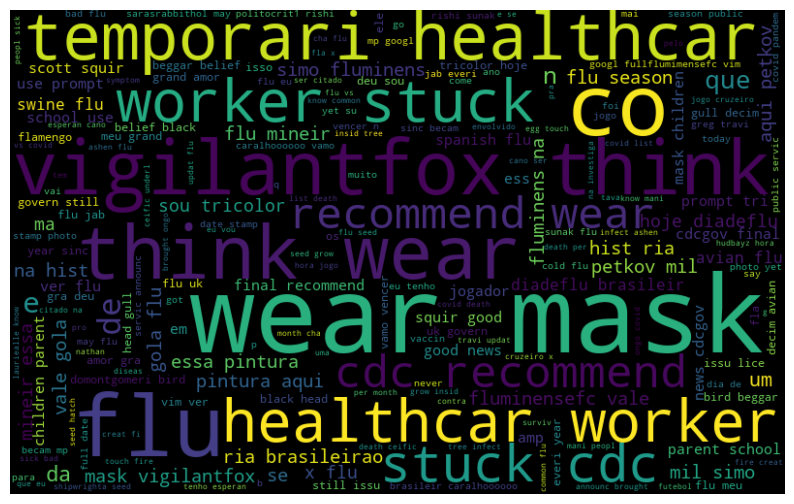

In [19]:
#Visualization
#Word Cloud
all_words = ' '.join([text for text in corpus])
wordcloud = WordCloud(width=800, height=500, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [20]:
# Function to remove punctuations, links, emojis, and stop words
def preprocessTweets(tweet):
    tweet = tweet.lower()  #has to be in place
    # Remove urls
    tweet = re.sub(r"http\S+|www\S+|https\S+", '', tweet, flags=re.MULTILINE)
    # Remove user @ references and '#' from tweet
    tweet = re.sub(r'\@\w+|\#|\d+', '', tweet)
    # Remove stopwords
    tweet_tokens = word_tokenize(tweet)  # convert string to tokens
    filtered_words = [w for w in tweet_tokens if w not in stop_words]
    filtered_words = [w for w in filtered_words if w not in emojis]
    filtered_words = [w for w in filtered_words if w in word_list]

    # Remove punctuations
    unpunctuated_words = [char for char in filtered_words if char not in string.punctuation]
    unpunctuated_words = ' '.join(unpunctuated_words)

    return "".join(unpunctuated_words)  # join words with a space in between them


# function to obtain adjectives from tweets
def getAdjectives(tweet):
    tweet = word_tokenize(tweet)  # convert string to tokens
    tweet = [word for (word, tag) in pos_tag(tweet)
             if tag == "JJ"]  # pos_tag module in NLTK library
    return " ".join(tweet)  # join words with a space in between them

In [21]:

# Defining my NLTK stop words and my user-defined stop words

stop_words = list(stopwords.words('english'))
user_stop_words = ['year', 'many', 'much', 'amp', 'next', 'cant', 'wont', 'hadnt',
                    'havent', 'hasnt', 'isnt', 'shouldnt', 'couldnt', 'wasnt', 'werent',
                    'mustnt', '’', '...', '..', '.', '.....', '....', 'been…', 'one', 'two',
                    'three', 'four', 'five', 'six', 'seven', 'eight', 'nine', 'ten', 'aht',
                    've', 'next',"agree","ah","al","able","aa","absolute","known","common"]
alphabets = list(string.ascii_lowercase)
stop_words = stop_words + user_stop_words + alphabets
word_list = words.words()  # all words in English language
emojis = list(UNICODE_EMOJI.keys())  # full list of emojis

In [22]:
print(preprocessTweets("I have a flu that's feels like a ""man flu"" 😫😫😫 men if this is how your flus feel like, ill never judge again. Nakufa mimi 😭😭"))

flu like man flu men feel like ill never judge


In [23]:
tweet_flu_df = tweet_flu_df[tweet_flu_df['text'].notna()]
# Apply preProcessTweets function to the 'text' column to generate a new column called 'Processed Tweets'.
tweet_flu_df['Processed_Tweets'] = tweet_flu_df['text'].apply(preprocessTweets)

In [24]:
tweet_flu_df.head()

,tweet_id,text,favorite_count,retweet_count,created_at,location,Processed_Tweets
0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",perhaps spirit broken fighting time perhaps en...
1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023,No location,perhaps spirit broken fighting time perhaps en...
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,martin flu
3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",perhaps spirit broken fighting time perhaps en...
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",flu de para contra river dos


In [24]:
# I had to write my results to a csv file at every instance due to the amount of time it took for the preprocessTweets
#  function to run
tweet_flu_df.to_csv('/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/processed/Tweets_preProcessed.csv') 
# Also, encoding is important when writing text to csv file

In [25]:
tweet_flu_df.head()

,tweet_id,text,favorite_count,retweet_count,created_at,location,Processed_Tweets
0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",perhaps spirit broken fighting time perhaps en...
1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023,No location,perhaps spirit broken fighting time perhaps en...
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,martin flu
3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",perhaps spirit broken fighting time perhaps en...
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",flu de para contra river dos


In [27]:
# function to return words to their base form using Lemmatizer
def preprocessTweetsSentiments(tweet):
    tweet_tokens = word_tokenize(tweet)
    lemmatizer = WordNetLemmatizer() # instatiate an object WordNetLemmatizer Class
    lemma_words = [lemmatizer.lemmatize(w) for w in tweet_tokens]
    return " ".join(lemma_words)

In [28]:
# Apply preprocessTweetsSentiments function to the 'Processed Tweets' column to generate a new column
# called 'Processed_Tweets'
tweet_flu_df['Tweets_Sentiments'] = tweet_flu_df['Processed_Tweets'].apply(preprocessTweetsSentiments)

In [29]:
# Apply getAdjectives function to the new 'Processed Tweets' column to generate a new column called 'Tweets_Adjectives'
tweet_flu_df['Tweets_Adjectives'] = tweet_flu_df['Processed_Tweets'].apply(getAdjectives)

In [30]:
tweet_flu_df.head()

,tweet_id,text,favorite_count,retweet_count,created_at,location,Processed_Tweets,Tweets_Sentiments,Tweets_Adjectives
0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",perhaps spirit broken fighting time perhaps en...,perhaps spirit broken fighting time perhaps en...,broken
1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023,No location,perhaps spirit broken fighting time perhaps en...,perhaps spirit broken fighting time perhaps en...,broken
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,martin flu,martin flu,
3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",perhaps spirit broken fighting time perhaps en...,perhaps spirit broken fighting time perhaps en...,broken
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",flu de para contra river dos,flu de para contra river do,contra


In [31]:
# I had to write my results to a csv file at every instance due to the amount of time it took for the preprocessTweets
#  function to run
tweet_flu_df.to_csv('/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/processed/Tweets_Processed.csv') 
# Also, encoding is important when writing text to csv file

In [32]:
# Extract all tweets into one long string with each word separate with a "space"
tweets_long_string = tweet_flu_df['Tweets_Adjectives'].tolist()
tweets_long_string = " ".join(tweets_long_string)

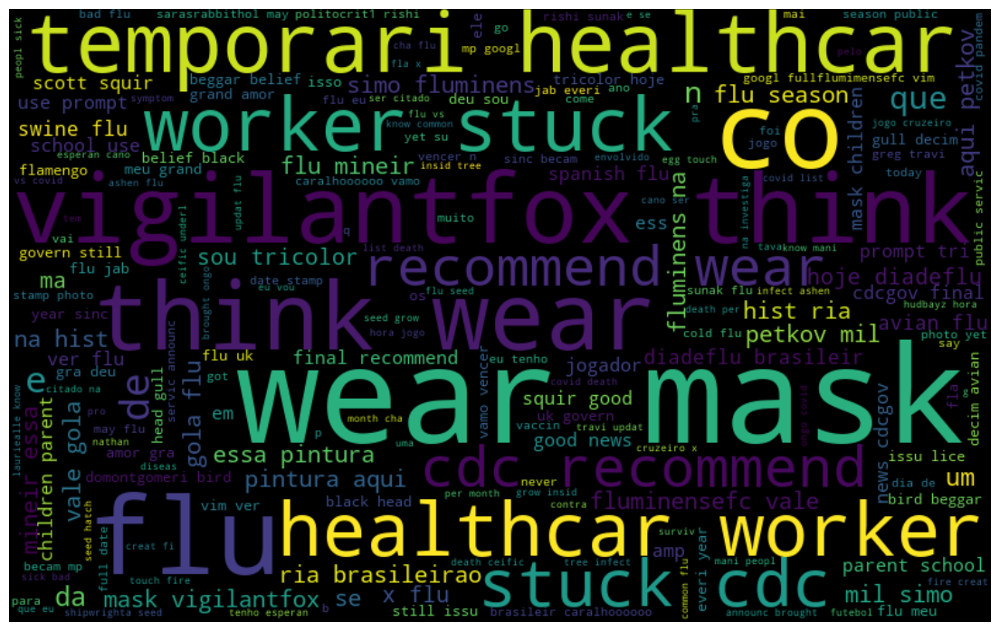

In [33]:
# Instantiate the Twitter word cloud object
twitter_wc = WordCloud(background_color='white', max_words=1500)

# generate the word cloud
twitter_wc.generate(tweets_long_string)

# display the word cloud
fig = plt.figure()
fig.set_figwidth(14)  # set width
fig.set_figheight(18)  # set height

plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()


In [33]:
twitter_wc.to_file("wordcloud.png") #save to a png file

In [34]:
# Combine all words into a list
tweets_long_string =  tweet_flu_df['Tweets_Adjectives'].tolist()
tweets_list=[]
for item in tweets_long_string:
    item = item.split()
    for i in item:
        tweets_list.append(i)

In [35]:
# Use the Built-in Python Collections module to determine Word frequency
from collections import Counter
counts = Counter(tweets_list)
df = pd.DataFrame.from_dict(counts, orient='index').reset_index()
df.columns = ['Words', 'Count']
df=df[df["Words"].isin(["flu","diarrhea","headache","fever","mask","bodyache","influenza","pendamic","positive","high","cough","cold","fatigue","sick","watery","contagious"])]
#df.sort_values(by='Count', ascending=False, inplace=True)
 

In [36]:
from plotly.subplots import make_subplots #to make more than one plot in Plotly
import plotly.express as px # To make express plots in Plotly
import chart_studio.tools as cst # For exporting to Chart studio
import chart_studio.plotly as py # for exporting Plotly visualizations to Chart Studio
import plotly.offline as pyo # Set notebook mode to work in offline
pyo.init_notebook_mode()
import plotly.io as pio # Plotly renderer
import plotly.graph_objects as go # For plotting plotly graph objects

# print(px.colors.sequential.Blues_r) to get the colour list used here. Please note, I swatched some colours

# Define my colours for the Plotly Plot
colors = ['rgb(8,48,107)', 'rgb(8,81,156)', 'rgb(33,113,181)', 'rgb(66,146,198)',
            'rgb(107,174,214)', 'rgb(158,202,225)', 'rgb(198,219,239)',
            'rgb(222,235,247)', 'rgb(247,251,255)', 'rgb(247,253,255)']

# Set layout for Plotly Subplots
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "xy"}, { "type": "domain"}]],
                    vertical_spacing=0.001)

# Add First Plot
fig.add_trace(go.Bar(x = df['Count'].head(10), y=df['Words'].head(10),marker=dict(color='rgba(66,146,198, 1)',
            line=dict(color='Black'),),name='Bar Chart',orientation='h'), 1, 1)

# Add Second Plot
fig.add_trace(go.Pie(labels=df['Words'].head(10),values=df['Count'].head(15),textinfo='label+percent',
                    insidetextorientation='radial', marker=dict(colors=colors, line=dict(color='DarkSlateGrey')),
                    name='Pie Chart'), 1, 2)
# customize layout
fig.update_layout(shapes=[dict(type="line",xref="paper", yref="paper", x0=0.5, y0=0, x1=0.5, y1=1.0,
         line_color='DarkSlateGrey', line_width=1)])

# customize plot title
fig.update_layout(showlegend=False, title=dict(text="Twitter Users' Flu symptoms analysis <i>(10 Most Common Words)</i>",
                  font=dict(size=18, )))

# Customize backgroound, margins, axis, title
fig.update_layout(yaxis=dict(showgrid=False,
                             showline=False,
                             showticklabels=True,
                             domain=[0, 1],
                             categoryorder='total ascending',
                             title=dict(text='Common Words', font_size=14)),
                             xaxis=dict(zeroline=False,
                             showline=False,
                             showticklabels=True,
                             showgrid=True,
                             domain=[0, 0.42],
                             title=dict(text='Word Count', font_size=14)),
                             margin=dict(l=100, r=20, t=70, b=70),
                             paper_bgcolor='rgba(0,0,0,0)',
                             plot_bgcolor='rgba(0,0,0,0)')

# Specify X and Y values for Annotations
x = df['Count'].head(10).to_list()
y = df['Words'].head(10).to_list()

# Show annotations on plot
annotations = [dict(xref='x1', yref='y1', x=xa + 350, y=ya, text=str(xa), showarrow=False) for xa, ya in zip(x, y)]

fig.update_layout(annotations=annotations)
fig.show()

In [37]:
#Sentiment Analysis Report
#Finding sentiment analysis (+ve, -ve and neutral)
# Create function to obtain Subjectivity Score
def getSubjectivity(tweet):
    return TextBlob(tweet).sentiment.subjectivity

# Create function to obtain Polarity Score
def getPolarity(tweet):
    return TextBlob(tweet).sentiment.polarity

# Create function to obtain Sentiment category
def getSentimentTextBlob(polarity):
    if polarity < 0:
        return "Negative"
    elif polarity == 0:
        return "Neutral"
    else:
        return "Positive"

In [38]:
# Apply all functions above to respective columns
tweet_flu_df['Subjectivity']=tweet_flu_df['Tweets_Sentiments'].apply(getSubjectivity)
tweet_flu_df['Polarity']=tweet_flu_df['Tweets_Sentiments'].apply(getPolarity)
tweet_flu_df['Sentiment']=tweet_flu_df['Polarity'].apply(getSentimentTextBlob)

In [39]:
# See quick results of the Sentiment Analysis
tweet_flu_df['Sentiment'].value_counts()

Neutral     21231
Positive     9387
Negative     6201
Name: Sentiment, dtype: int64

In [40]:
# Create dataframe for Count of Sentiment Categories
pie_chart = tweet_flu_df['Sentiment'].value_counts().rename_axis('Sentiment').to_frame('Total Tweets').reset_index()

In [41]:
pie_chart

,Sentiment,Total Tweets
0,Neutral,21231
1,Positive,9387
2,Negative,6201


In [42]:
sentiments_piechart = px.pie(pie_chart,values='Total Tweets', names='Sentiment', title='Distribution of Sentiments Results')
sentiments_piechart.show()

In [43]:
tweet_flu_df.head()

,tweet_id,text,favorite_count,retweet_count,created_at,location,Processed_Tweets,Tweets_Sentiments,Tweets_Adjectives,Subjectivity,Polarity,Sentiment
0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",perhaps spirit broken fighting time perhaps en...,perhaps spirit broken fighting time perhaps en...,broken,0.4,-0.4,Negative
1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023,No location,perhaps spirit broken fighting time perhaps en...,perhaps spirit broken fighting time perhaps en...,broken,0.4,-0.4,Negative
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,martin flu,martin flu,,0.0,0.0,Neutral
3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",perhaps spirit broken fighting time perhaps en...,perhaps spirit broken fighting time perhaps en...,broken,0.4,-0.4,Negative
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",flu de para contra river dos,flu de para contra river do,contra,0.0,0.0,Neutral


In [44]:
# Remove Unnecessary columns. I used copy here because I wanted a datframe that does not impact my original dataframe
tableau_df = tweet_flu_df.drop((['Processed_Tweets','Tweets_Sentiments','Subjectivity','Polarity']), axis=1).copy(deep=True)

In [55]:
tableau_df.head()

,tweet_id,text,favorite_count,retweet_count,created_at,location,Tweets_Adjectives,Sentiment
0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",broken,Negative
1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023,No location,broken,Negative
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,,Neutral
3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",broken,Negative
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",contra,Neutral


In [56]:
tableau_df["location"].head()

0    Federal Capital Territory, Nig
1                       No location
2         I want to live inside her
3               Rio Grande City, TX
4            Rio de Janeiro, Brasil
Name: location, dtype: object

In [57]:
tableau_df=tableau_df.drop(index=(2000))

In [58]:
tableau_df.filter(items=["text","retweet_count"]).sort_values(by=["retweet_count"],ascending=False).head(1)

,text,retweet_count
20687,RT @videogamedeals: Follow @videogamedeals &am...,9985


In [59]:
tableau_df.filter(items=["text","retweet_count"]).sort_values(by=["retweet_count"],ascending=True).head(1)

,text,retweet_count
10954,arma velada,Brasil


In [60]:
tableau_df.groupby("created_at").head()

,tweet_id,text,favorite_count,retweet_count,created_at,location,Tweets_Adjectives,Sentiment
0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",broken,Negative
1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023,No location,broken,Negative
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,,Neutral
3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",broken,Negative
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",contra,Neutral
...,...,...,...,...,...,...,...,...
46182,NaN,RT @Cartoontriper1: I don't know why every mov...,0,1,Thu May 18 19:13:34 +0000 2023,"Mexicali, Baja California",,Positive
46183,NaN,@OnPointMMA @OvinVithanage Mild diarrhea is be...,0,0,Thu May 18 19:13:31 +0000 2023,No location,mild explosive want,Positive
46184,NaN,RT @TheWakeninq: Brian Krassestein spreading d...,0,74,Thu May 18 19:13:16 +0000 2023,No location,,Neutral
46186,NaN,Sorry to say there will be no stream tonight. ...,6,0,Thu May 18 23:28:43 +0000 2023,PlayStation,cocky oh,Negative


In [61]:
# Export to csv file.
tableau_df.to_csv('/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/processed/Tweets_Tableau_Final_File.csv')

In [62]:
tableau_df=pd.read_csv('/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/processed/Tweets_Tableau_Final_File.csv',encoding='utf-8')

In [63]:
tableau_df.head()

,Unnamed: 0,tweet_id,text,favorite_count,retweet_count,created_at,location,Tweets_Adjectives,Sentiment
0,0,1656375708594196487,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",broken,Negative
1,1,1656375681289166848,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:31 +0000 2023,No location,broken,Negative
2,2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,NaN,Neutral
3,3,1656375658694553601,RT @TopGirlKeiko: Perhaps his spirit is broken...,0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",broken,Negative
4,4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros ...,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",contra,Neutral


Signing up and getting your API Key
- To register for HERE platform account, go to platform.here.com and click on Create a free account.
- On the platform portal page, under Access location services, click on Create an app. It opens the Register new app dialog. Enter an app name and click Register.

here.user.id = HERE-ed34d2a4-f583-47f8-b25d-6d49b06d05ae
here.client.id = fPtqSqiS7HukOPotq5kC
here.access.key.id = IbEuVjLQSKViCWtH66V1Ig
here.access.key.secret = ewr90N6maCO6SlbMhjzRTKZlZx9lmz2dLyrYUQdPn4EFOMlJPcmCmqm1kXIz9sKFXov-Rt4oHXZb_Gek4TNqZA
here.token.endpoint.url = https://account.api.here.com/oauth2/token

here.user.id = HERE-ed34d2a4-f583-47f8-b25d-6d49b06d05ae
here.client.id = fPtqSqiS7HukOPotq5kC
here.access.key.id = MHVJFp8d21Ged_h27Q057g
here.access.key.secret = APh85Q1QdIG7i6p-2fyQphROr6tSdUr3jMOH8PaH5-4QCNC1P1pCuktJ1aQM9RjxlBxdHzmL9sC1ncyKjAUVCg
here.token.endpoint.url = https://account.api.here.com/oauth2/token


In [9]:
import requests
URL = "https://geocode.search.hereapi.com/v1/geocode"  # Developer Here API link
api_key = 'XRQeQqX6i-ywCH2kUDP0wEwt2K9LH08zyXAqJTNtA2k'  # Acquire api key from developer.here.com
def getCoordinates(location):
    
    PARAMS = {'apikey': api_key, 'q': location} # required parameters
    r = requests.get(url=URL, params=PARAMS)
    # get raw json file. I did  this because when I combined this step with my "getLocation" function, 
    # it gave me error for countries with no country_code or country_name. Hence, I needed to use try - except block
    data = r.json() # Raw json file 
        
    return data


In [19]:
tweet_flu_df['location'].count()

28054

In [20]:
#Result in column value as json object
tweet_flu_df['Location_data']=tweet_flu_df['location'].head(500).apply(getCoordinates) # Apply getCoordinates Function

In [ ]:
#Load rows 1001 to 3000
tweet_flu_df = pd.read_csv("/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/raw/tweeterFluData.csv",skiprows=[500])

#tweet_flu_df['Location_data']=tweet_flu_df['location'].apply(getCoordinates)

In [21]:
tweet_flu_df['Location_data'].count()

500

In [23]:
pd.set_option('display.max_colwidth',-1)
tweet_flu_df['Location_data'].tail(20)

/var/folders/jh/0vc4j76j79g_1kb570k87_4h0000gn/T/ipykernel_3890/4061383073.py:1: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth',-1)


46199    {'error': 'Too Many Requests', 'error_description': 'Rate limit for this service has been reached'}
46200    {'error': 'Too Many Requests', 'error_description': 'Rate limit for this service has been reached'}
46201    {'error': 'Too Many Requests', 'error_description': 'Rate limit for this service has been reached'}
46202    {'error': 'Too Many Requests', 'error_description': 'Rate limit for this service has been reached'}
46203    {'error': 'Too Many Requests', 'error_description': 'Rate limit for this service has been reached'}
46204    {'error': 'Too Many Requests', 'error_description': 'Rate limit for this service has been reached'}
46205    {'error': 'Too Many Requests', 'error_description': 'Rate limit for this service has been reached'}
46206    {'error': 'Too Many Requests', 'error_description': 'Rate limit for this service has been reached'}
46207    {'error': 'Too Many Requests', 'error_description': 'Rate limit for this service has been reached'}
46208    {'error': 

In [54]:
tweet_flu_df.head()

,tweet_id,text,favorite_count,retweet_count,created_at,location,Processed_Tweets,Tweets_Sentiments,Tweets_Adjectives,Subjectivity,Polarity,Sentiment,Location_data
0,1656375708594196487,"RT @TopGirlKeiko: Perhaps his spirit is broken from fighting all the time. Perhaps his energy is off for that day. Perhaps, he has the flu.…",0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",perhaps spirit broken fighting time perhaps energy day perhaps,perhaps spirit broken fighting time perhaps energy day perhaps,broken,0.4,-0.4,Negative,"{'items': [{'title': 'Federal Capital Territory, Nigeria', 'id': 'here:cm:namedplace:23699956', 'resultType': 'administrativeArea', 'administrativeAreaType': 'state', 'address': {'label': 'Federal Capital Territory, Nigeria', 'countryCode': 'NGA', 'countryName': 'Nigeria', 'state': 'Federal Capital Territory'}, 'position': {'lat': 9.06344, 'lng': 7.46228}, 'mapView': {'west': 6.77852, 'south': 8.45755, 'east': 7.73006, 'north': 9.43161}, 'scoring': {'queryScore': 0.88, 'fieldScore': {'state': 1.0}}}]}"
1,1656375681289166848,"RT @TopGirlKeiko: Perhaps his spirit is broken from fighting all the time. Perhaps his energy is off for that day. Perhaps, he has the flu.…",0,10,Wed May 10 19:08:31 +0000 2023,No location,perhaps spirit broken fighting time perhaps energy day perhaps,perhaps spirit broken fighting time perhaps energy day perhaps,broken,0.4,-0.4,Negative,{'items': []}
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,martin flu,martin flu,,0.0,0.0,Neutral,{'items': []}
3,1656375658694553601,"RT @TopGirlKeiko: Perhaps his spirit is broken from fighting all the time. Perhaps his energy is off for that day. Perhaps, he has the flu.…",0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",perhaps spirit broken fighting time perhaps energy day perhaps,perhaps spirit broken fighting time perhaps energy day perhaps,broken,0.4,-0.4,Negative,"{'items': [{'title': 'Rio Grande City, TX, United States', 'id': 'here:cm:namedplace:21098101', 'resultType': 'locality', 'localityType': 'city', 'address': {'label': 'Rio Grande City, TX, United States', 'countryCode': 'USA', 'countryName': 'United States', 'stateCode': 'TX', 'state': 'Texas', 'county': 'Starr', 'city': 'Rio Grande City', 'postalCode': '78582'}, 'position': {'lat': 26.3779, 'lng': -98.81471}, 'mapView': {'west': -98.86615, 'south': 26.35404, 'east': -98.76989, 'north': 26.39789}, 'scoring': {'queryScore': 1.0, 'fieldScore': {'state': 1.0, 'city': 1.0}}}]}"
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros grupos de sócio e para o jogo contra o River dos sócios categoria 1.… https://t.co/EiHIZGCeh6,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",flu de para contra river dos,flu de para contra river do,contra,0.0,0.0,Neutral,"{'items': [{'title': 'Rio de Janeiro, RJ, Brasil', 'id': 'here:cm:namedplace:23039216', 'resultType': 'locality', 'localityType': 'city', 'address': {'label': 'Rio de Janeiro, RJ, Brasil', 'countryCode': 'BRA', 'countryName': 'Brasil', 'stateCode': 'RJ', 'state': 'Rio de Janeiro', 'city': 'Rio de Janeiro', 'postalCode': '20040-009'}, 'position': {'lat': -22.91216, 'lng': -43.17501}, 'mapView': {'west': -43.79635, 'south': -23.07652, 'east': -43.026, 'north': -22.6769}, 'scoring': {'queryScore': 1.0, 'fieldScore': {'country': 1.0, 'city': 1.0}}}]}"


In [55]:
tweet_flu_df.dtypes

tweet_id             object 
text                 object 
favorite_count       object 
retweet_count        object 
created_at           object 
location             object 
Processed_Tweets     object 
Tweets_Sentiments    object 
Tweets_Adjectives    object 
Subjectivity         float64
Polarity             float64
Sentiment            object 
Location_data        object 
dtype: object

In [56]:
explode_df=pd.json_normalize(tweet_flu_df['Location_data'])

In [57]:
normalizex_df=pd.json_normalize(explode_df['items'])
normalize_df=pd.json_normalize(normalizex_df[0])
normalize_df

,title,id,resultType,administrativeAreaType,address.label,address.countryCode,address.countryName,address.state,position.lat,position.lng,...,address.street,scoring.fieldScore.streets,scoring.fieldScore.county,access,categories,address.houseNumber,scoring.fieldScore.placeName,foodTypes,houseNumberType,scoring.fieldScore.houseNumber
0,"Federal Capital Territory, Nigeria",here:cm:namedplace:23699956,administrativeArea,state,"Federal Capital Territory, Nigeria",NGA,Nigeria,Federal Capital Territory,9.06344,7.46228,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"Rio Grande City, TX, United States",here:cm:namedplace:21098101,locality,NaN,"Rio Grande City, TX, United States",USA,United States,Texas,26.37790,-98.81471,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"Rio de Janeiro, RJ, Brasil",here:cm:namedplace:23039216,locality,NaN,"Rio de Janeiro, RJ, Brasil",BRA,Brasil,Rio de Janeiro,-22.91216,-43.17501,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36814,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36815,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36816,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36817,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [58]:
tweet_flu_df["CountryName"]=normalize_df["address.countryName"]
tweet_flu_df["CountryCode"]=normalize_df["address.countryCode"]
tweet_flu_df["Longitude"]=normalize_df["position.lng"]
tweet_flu_df["Latitude"]=normalize_df["position.lat"]

In [59]:
tweet_flu_df.head()

,tweet_id,text,favorite_count,retweet_count,created_at,location,Processed_Tweets,Tweets_Sentiments,Tweets_Adjectives,Subjectivity,Polarity,Sentiment,Location_data,CountryName,CountryCode,Longitude,Latitude
0,1656375708594196487,"RT @TopGirlKeiko: Perhaps his spirit is broken from fighting all the time. Perhaps his energy is off for that day. Perhaps, he has the flu.…",0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",perhaps spirit broken fighting time perhaps energy day perhaps,perhaps spirit broken fighting time perhaps energy day perhaps,broken,0.4,-0.4,Negative,"{'items': [{'title': 'Federal Capital Territory, Nigeria', 'id': 'here:cm:namedplace:23699956', 'resultType': 'administrativeArea', 'administrativeAreaType': 'state', 'address': {'label': 'Federal Capital Territory, Nigeria', 'countryCode': 'NGA', 'countryName': 'Nigeria', 'state': 'Federal Capital Territory'}, 'position': {'lat': 9.06344, 'lng': 7.46228}, 'mapView': {'west': 6.77852, 'south': 8.45755, 'east': 7.73006, 'north': 9.43161}, 'scoring': {'queryScore': 0.88, 'fieldScore': {'state': 1.0}}}]}",Nigeria,NGA,7.46228,9.06344
1,1656375681289166848,"RT @TopGirlKeiko: Perhaps his spirit is broken from fighting all the time. Perhaps his energy is off for that day. Perhaps, he has the flu.…",0,10,Wed May 10 19:08:31 +0000 2023,No location,perhaps spirit broken fighting time perhaps energy day perhaps,perhaps spirit broken fighting time perhaps energy day perhaps,broken,0.4,-0.4,Negative,{'items': []},NaN,NaN,NaN,NaN
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,martin flu,martin flu,,0.0,0.0,Neutral,{'items': []},NaN,NaN,NaN,NaN
3,1656375658694553601,"RT @TopGirlKeiko: Perhaps his spirit is broken from fighting all the time. Perhaps his energy is off for that day. Perhaps, he has the flu.…",0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",perhaps spirit broken fighting time perhaps energy day perhaps,perhaps spirit broken fighting time perhaps energy day perhaps,broken,0.4,-0.4,Negative,"{'items': [{'title': 'Rio Grande City, TX, United States', 'id': 'here:cm:namedplace:21098101', 'resultType': 'locality', 'localityType': 'city', 'address': {'label': 'Rio Grande City, TX, United States', 'countryCode': 'USA', 'countryName': 'United States', 'stateCode': 'TX', 'state': 'Texas', 'county': 'Starr', 'city': 'Rio Grande City', 'postalCode': '78582'}, 'position': {'lat': 26.3779, 'lng': -98.81471}, 'mapView': {'west': -98.86615, 'south': 26.35404, 'east': -98.76989, 'north': 26.39789}, 'scoring': {'queryScore': 1.0, 'fieldScore': {'state': 1.0, 'city': 1.0}}}]}",United States,USA,-98.81471,26.37790
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros grupos de sócio e para o jogo contra o River dos sócios categoria 1.… https://t.co/EiHIZGCeh6,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",flu de para contra river dos,flu de para contra river do,contra,0.0,0.0,Neutral,"{'items': [{'title': 'Rio de Janeiro, RJ, Brasil', 'id': 'here:cm:namedplace:23039216', 'resultType': 'locality', 'localityType': 'city', 'address': {'label': 'Rio de Janeiro, RJ, Brasil', 'countryCode': 'BRA', 'countryName': 'Brasil', 'stateCode': 'RJ', 'state': 'Rio de Janeiro', 'city': 'Rio de Janeiro', 'postalCode': '20040-009'}, 'position': {'lat': -22.91216, 'lng': -43.17501}, 'mapView': {'west': -43.79635, 'south': -23.07652, 'east': -43.026, 'north': -22.6769}, 'scoring': {'queryScore': 1.0, 'fieldScore': {'country': 1.0, 'city': 1.0}}}]}",Brasil,BRA,-43.17501,-22.91216


In [60]:
tweet_flu_df.drop((['Location_data']), axis=1)


,tweet_id,text,favorite_count,retweet_count,created_at,location,Processed_Tweets,Tweets_Sentiments,Tweets_Adjectives,Subjectivity,Polarity,Sentiment,CountryName,CountryCode,Longitude,Latitude
0,1656375708594196487,"RT @TopGirlKeiko: Perhaps his spirit is broken from fighting all the time. Perhaps his energy is off for that day. Perhaps, he has the flu.…",0,10,Wed May 10 19:08:37 +0000 2023,"Federal Capital Territory, Nig",perhaps spirit broken fighting time perhaps energy day perhaps,perhaps spirit broken fighting time perhaps energy day perhaps,broken,0.400000,-0.400000,Negative,Nigeria,NGA,7.46228,9.06344
1,1656375681289166848,"RT @TopGirlKeiko: Perhaps his spirit is broken from fighting all the time. Perhaps his energy is off for that day. Perhaps, he has the flu.…",0,10,Wed May 10 19:08:31 +0000 2023,No location,perhaps spirit broken fighting time perhaps energy day perhaps,perhaps spirit broken fighting time perhaps energy day perhaps,broken,0.400000,-0.400000,Negative,NaN,NaN,NaN,NaN
2,1656375675517915151,Martin Tyler has flu 😂,0,0,Wed May 10 19:08:29 +0000 2023,I want to live inside her,martin flu,martin flu,,0.000000,0.000000,Neutral,NaN,NaN,NaN,NaN
3,1656375658694553601,"RT @TopGirlKeiko: Perhaps his spirit is broken from fighting all the time. Perhaps his energy is off for that day. Perhaps, he has the flu.…",0,10,Wed May 10 19:08:25 +0000 2023,"Rio Grande City, TX",perhaps spirit broken fighting time perhaps energy day perhaps,perhaps spirit broken fighting time perhaps energy day perhaps,broken,0.400000,-0.400000,Negative,United States,USA,-98.81471,26.37790
4,1656375612720783367,Amanhã abre a compra do Fla x Flu pros outros grupos de sócio e para o jogo contra o River dos sócios categoria 1.… https://t.co/EiHIZGCeh6,0,0,Wed May 10 19:08:14 +0000 2023,"Rio de Janeiro, Brasil",flu de para contra river dos,flu de para contra river do,contra,0.000000,0.000000,Neutral,Brasil,BRA,-43.17501,-22.91216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
46182,NaN,RT @Cartoontriper1: I don't know why every movie of the end of 90's needed to have a loud Diarrhea moment https://t.co/YEEte1Xqhk,0,1,Thu May 18 19:13:34 +0000 2023,"Mexicali, Baja California",know every movie end loud diarrhea moment,know every movie end loud diarrhea moment,,0.800000,0.100000,Positive,NaN,NaN,NaN,NaN
46183,NaN,"@OnPointMMA @OvinVithanage Mild diarrhea is better than explosive, but I wouldn’t want it to be a $90 PPV headlining “title” fight either.",0,0,Thu May 18 19:13:31 +0000 2023,No location,mild diarrhea better explosive want title fight either,mild diarrhea better explosive want title fight either,mild explosive want,0.500000,0.416667,Positive,NaN,NaN,NaN,NaN
46184,NaN,RT @TheWakeninq: Brian Krassestein spreading diarrhea AGAIN all over Twitter \n\nElon musk red pilling the normie 🤪 https://t.co/TJpzcCdIxs,0,74,Thu May 18 19:13:16 +0000 2023,No location,spreading diarrhea twitter musk red,spreading diarrhea twitter musk red,,0.000000,0.000000,Neutral,NaN,NaN,NaN,NaN
46186,NaN,Sorry to say there will be no stream tonight. 😔 I was getting all cocky saying oh wow guess no allergies for me thi… https://t.co/jxeG4JHTlU,6,0,Thu May 18 23:28:43 +0000 2023,PlayStation,sorry say stream tonight getting cocky saying oh wow guess,sorry say stream tonight getting cocky saying oh wow guess,cocky oh,0.966667,-0.200000,Negative,NaN,NaN,NaN,NaN


In [61]:
# Export to csv file.
tweet_flu_df.to_csv('/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/processed/Tweets_withGeocode_Final_File.csv',mode='a')

In [49]:
tweet_flu_Geo_df=pd.read_csv('/Users/kirtikamerkar/Austincapitaldata/data_engineer_curr/data/processed/Tweets_withGeocode_Final_File.csv')

/var/folders/jh/0vc4j76j79g_1kb570k87_4h0000gn/T/ipykernel_2548/917360076.py:1: DtypeWarning:

Columns (1,3,4,13,14,15) have mixed types. Specify dtype option on import or set low_memory=False.



In [50]:
tweet_flu_Geo_df.count()

Unnamed: 0           36819
tweet_id             29875
text                 36819
favorite_count       36665
retweet_count        36619
created_at           36610
location             36819
Processed_Tweets     35429
Tweets_Sentiments    35429
Tweets_Adjectives    21113
Subjectivity         36819
Polarity             36819
Sentiment            36819
Location_data          500
CountryName            253
CountryCode            253
Longitude              253
Latitude               253
dtype: int64

In [9]:
!pip install maskpass

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.2/89.2 kB 1.1 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.3/228.3 kB 2.6 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 735.9/735.9 kB 1.1 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.4/390.4 kB 1.3 MB/s eta 0:00:0000:0100:01


### Dashboard Design with Tableau:

- Download the Tableau and install it.(used tableau public)

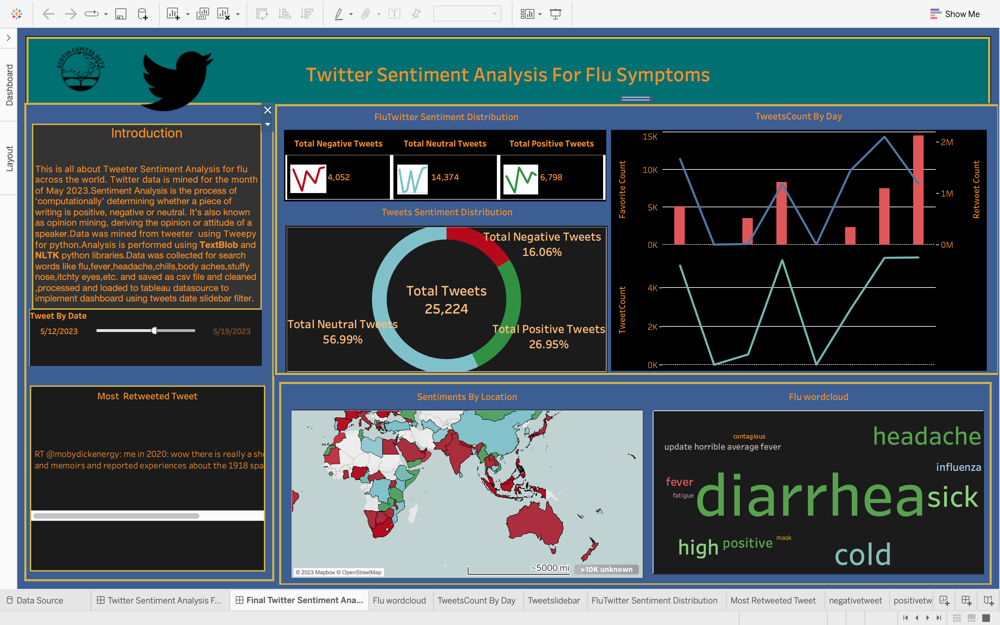

- To build the above dashboard I have created totally 10 sheets/workbooks,used some external images like logos,created text Object to show introduction of dashboard.
- To proper alignment of layout I used horizontal and vertical containers.

#### Sheet 1:Sentiments By Location
- Right Click on Location Field and go to geographic role and select Country/Region.Automatically Longitude and Latitude gets generated which is needed to plot map.
- Drag longitude generated and latitude generated on columns and rows field respectively,so that map will pop up on sheet.
- Add details,marks,filters to analyze your data.
- Format title,background,boarder,shading ,fond,etc. as per requirements.

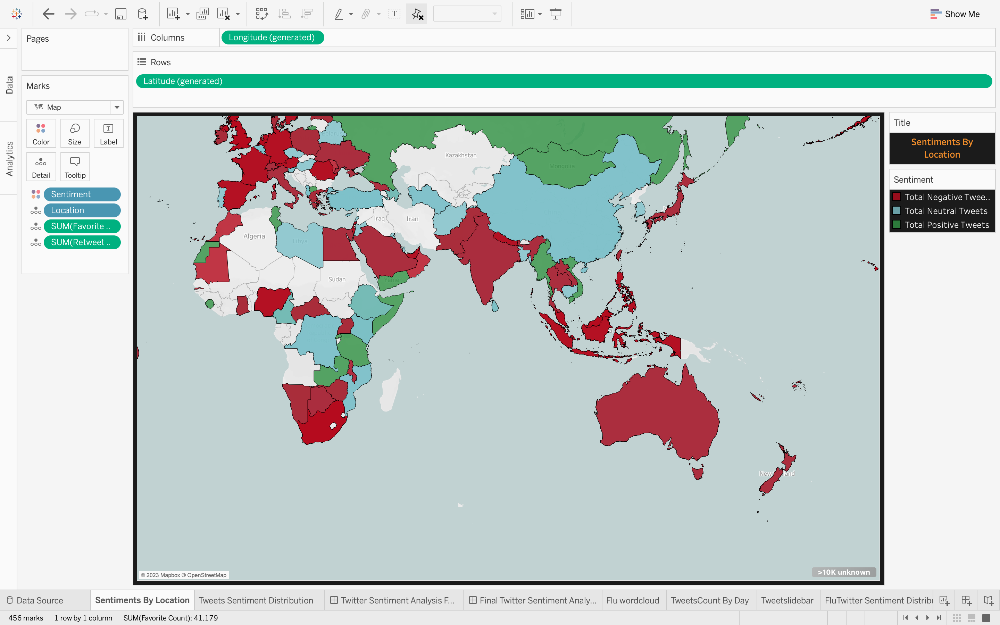

#### Sheet 2 :Tweets Sentiment Distribtion
- This is donut chart.To build this you need to use dual axis mode.
- First,drag Sentiment in rows field and total number of tweets i.e. nothing but count of all text field.
- Select pie chart.
- Label first pie with sentiments and in %.To calculate percentage,go to field in marks,right click and select quick table calculation and select percentage of Total.
- Create two pie chart using caluculated field sum(0).Drag that field twice on rows field.
- Edit both charts.We need second pie chart with only total number of tweets,so that select 2nd pie chart and covert to circle chart and remove both the fiels.So that we can see pie chart as circle.Drag TweetCount to label marks and edit it with Total Tweets with count.
- We can edit label,background,font,color,etc.according to your need.
- Now, we have two separate pie chart.To make donut adjust the size of both pie chart in such a manner that after overlapping it looks like donut chart.
- Apply dual axis from 2nd row and resize the both charts so that it looks like donut.

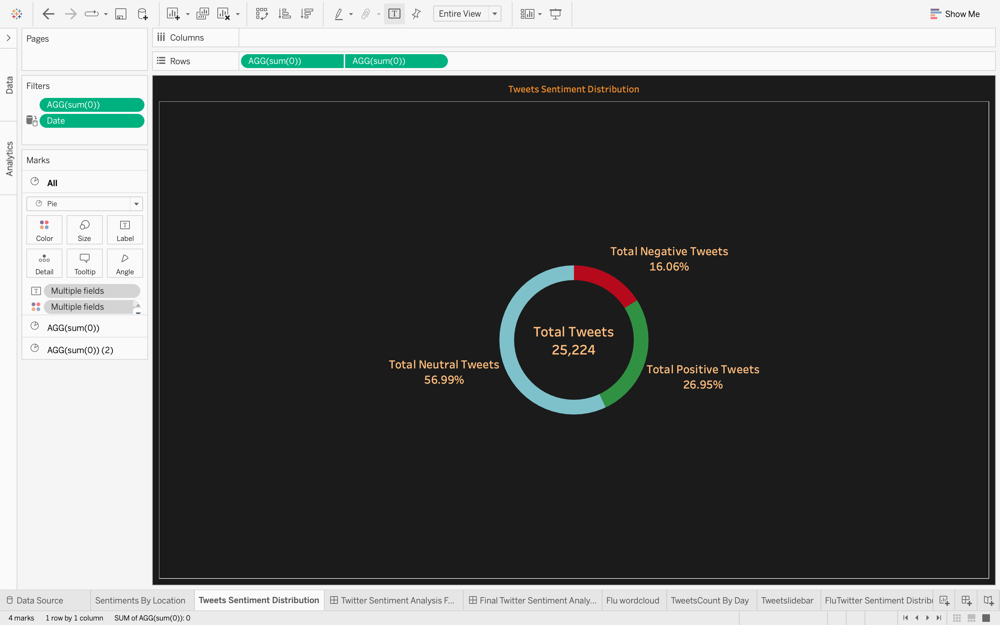

#### Sheet 3: Tweets count By days(Time series)
- Drag Created At field to columns and Favorite Count,Retweet Count and TweetCount at rows field.
- Select lines(discrete)chart.
- Apply filter for data and month.

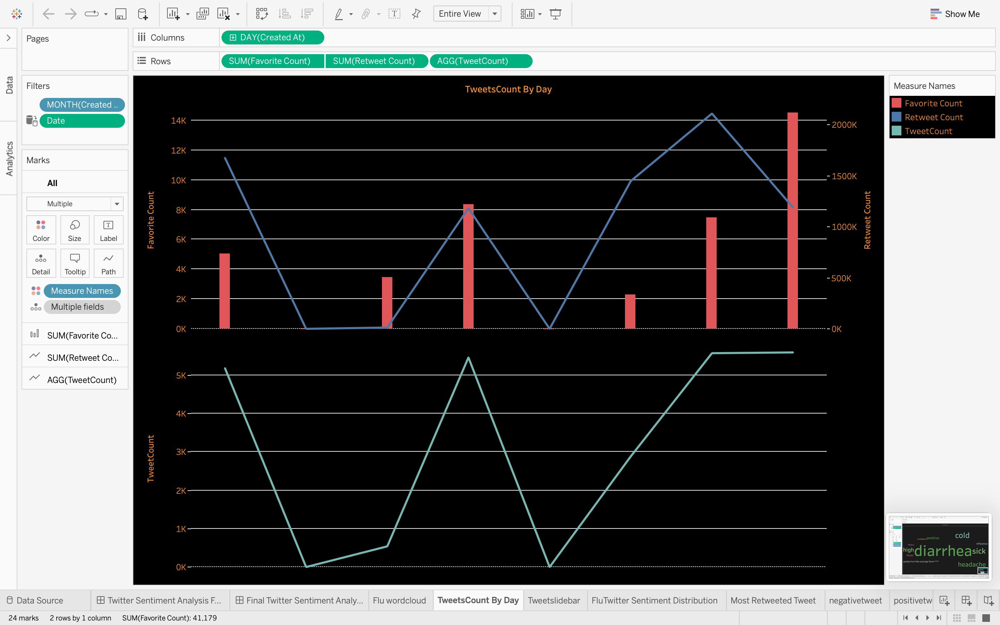

#### Sheet 4: Flu WordCloud
- WordCloud is nothing but text chart.
- Drag Tweets Adjective to rows with using custom filter with word list related with flu symptoms.
- Drag TweetAdjectiveCount,which is calculated field,to rows.
- Select treemaps chart and select text from marks.Also, add tweetAdjectivecount to details on marka panel.
- Edit background,color code ,etc.

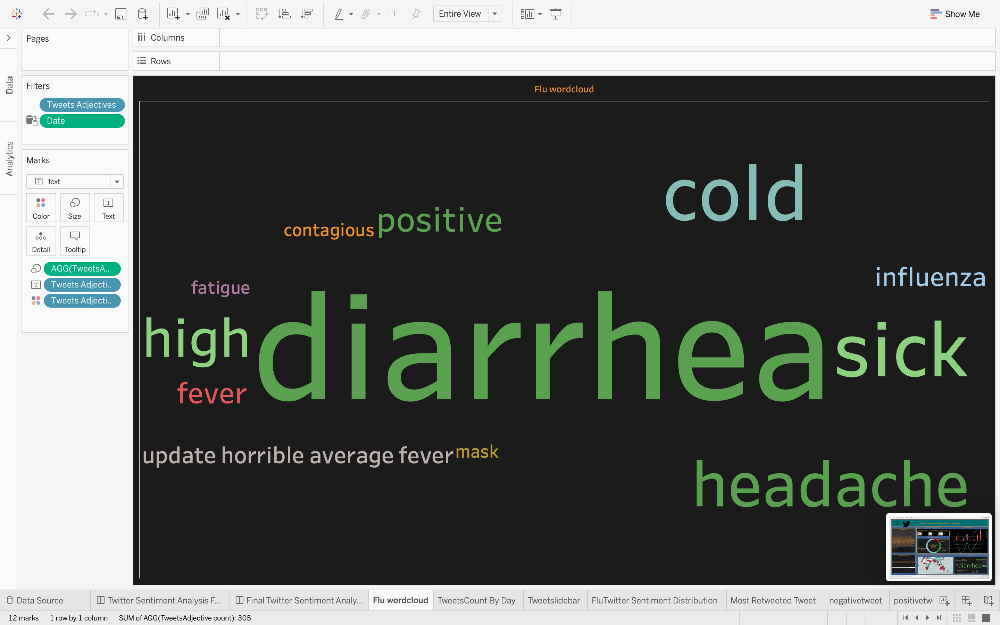

#### Sheet 5: Flu Twitter Distribution(KPI)
- Drag Sentiment to column field and TweetCount which is calculated field is dragged into Text from marks pane.
- Select Entire View.
- Edit the titles,alignment,border,shading,font,etc.
- KPI are ready

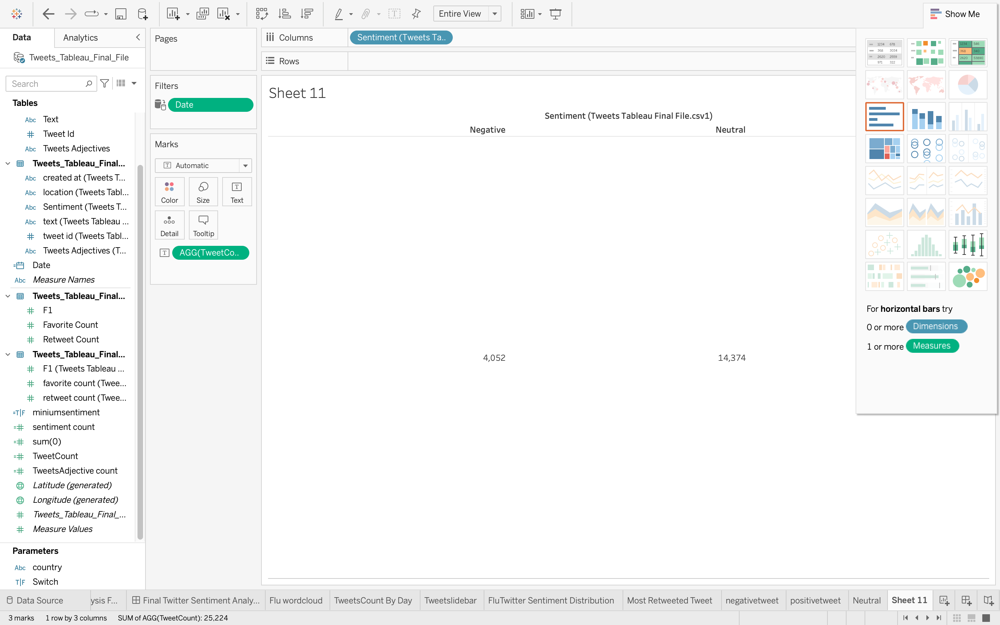

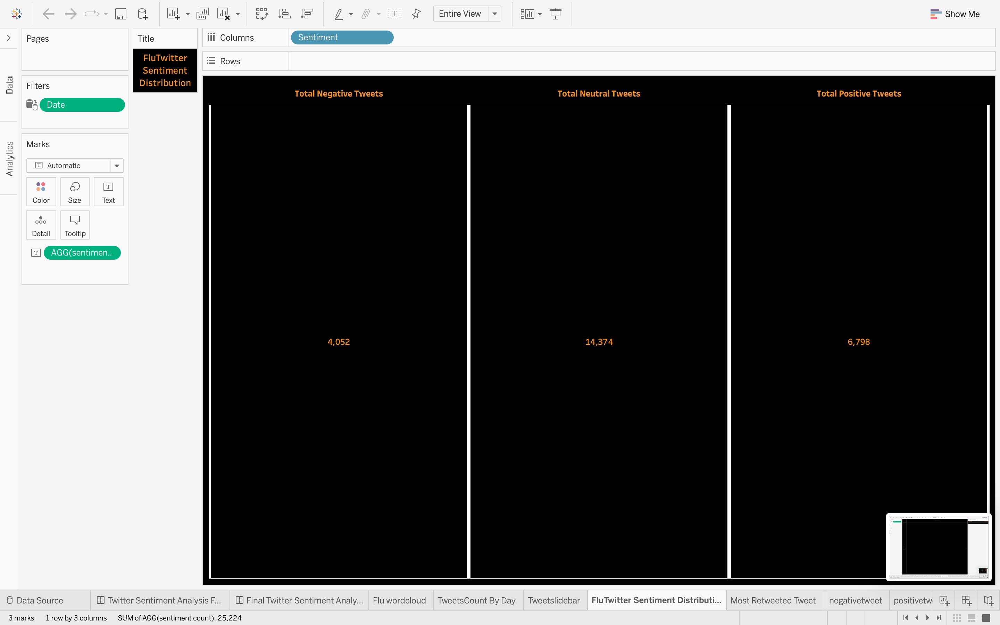

#### Sheet 6: Tweet Created Data slidebar(Filter)
- This slidebar is used to interact whole dashboard with each other while changing tweet created date.
- To create slidebar just create filter of Date.Date field is calculated by Created At field.
- Need use only filter window to represent slidebar. Hide/overlap rest of the sheet in dashboard layout.

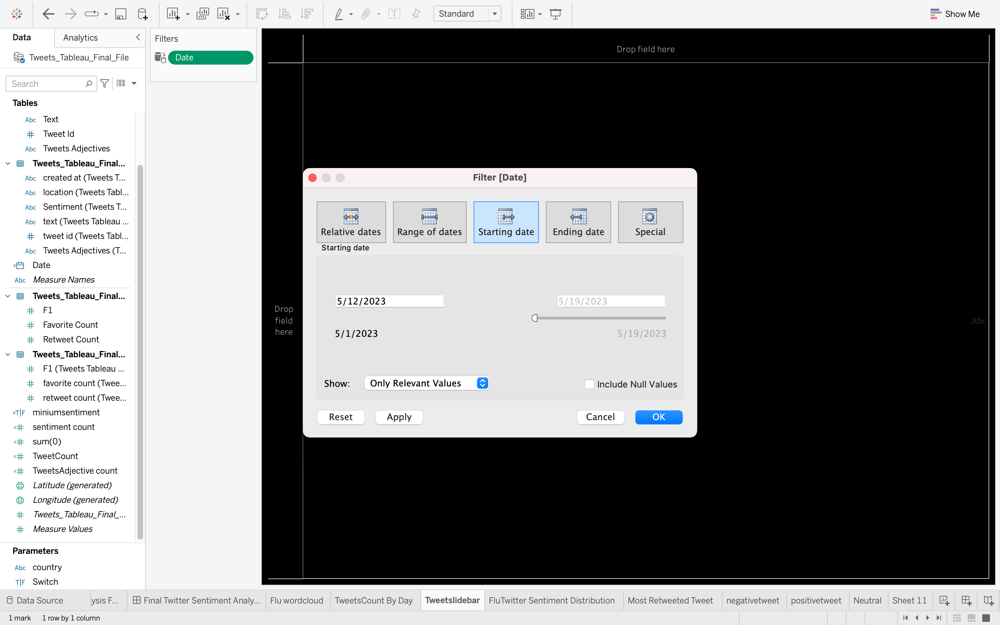

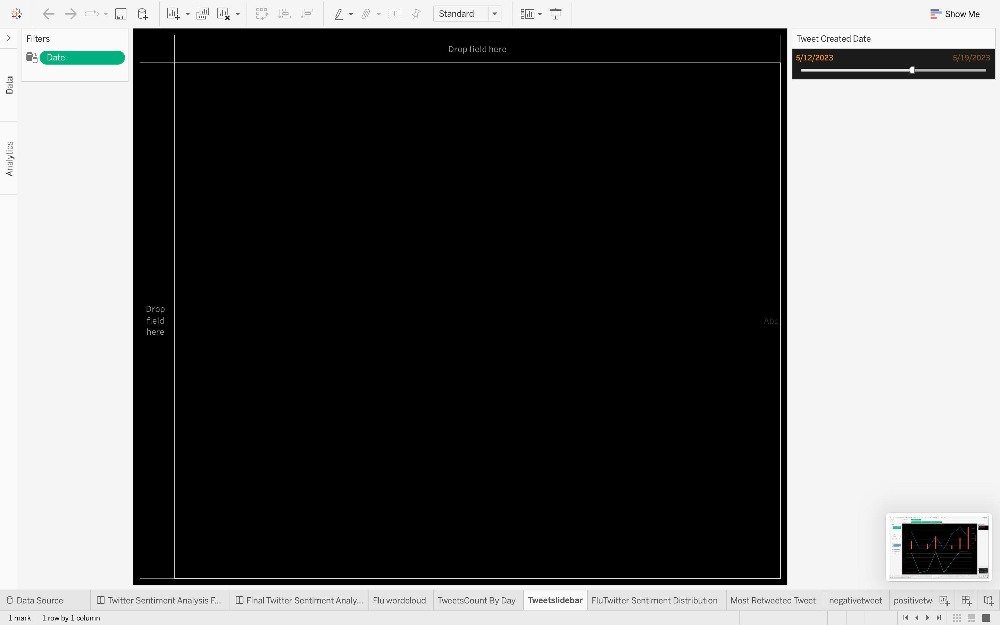

#### Sheet 7: Most Retweeted Tweet
- Drag Text field into filters,apply filter to find top most Retweeted text i.e.top most text with maximum retweetcount.
- Adjust the sheet size,format title,background,shading,font,etc.

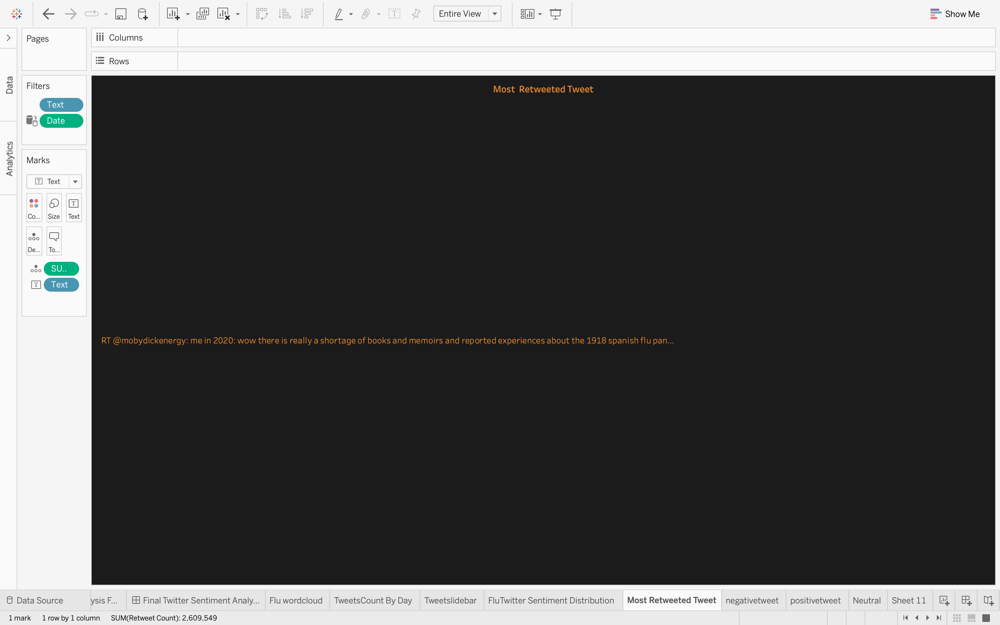

#### Sheet 8,9 and 10:Analysis of Positive,Negative and Neutral tweets 
- These three sheets are used to attach with KPIs.
- These are simple line(discrete)to show variation of tweetCount by Date for each sentiment.
- Drag Day(Date) at columns and Tweetcount at rows and apply filter to choose different sentiments as Positive,Negative and Neutral for respective sheets.

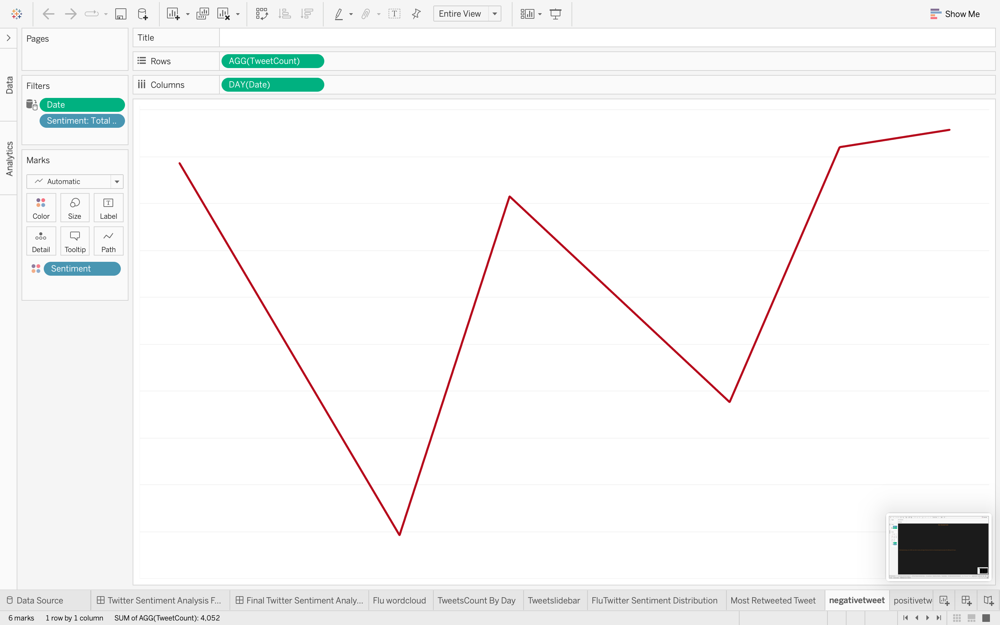
 

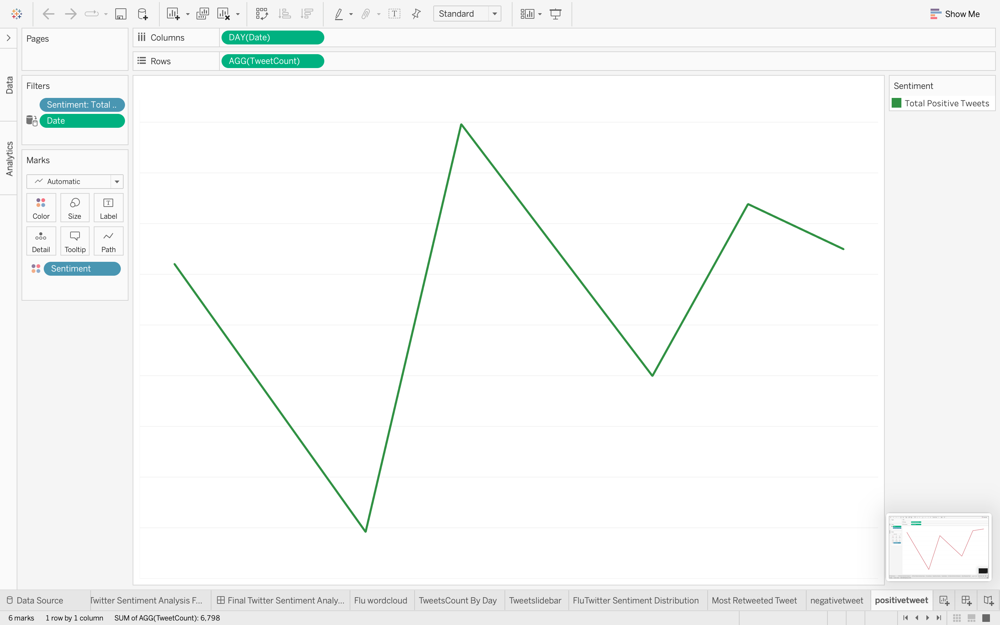

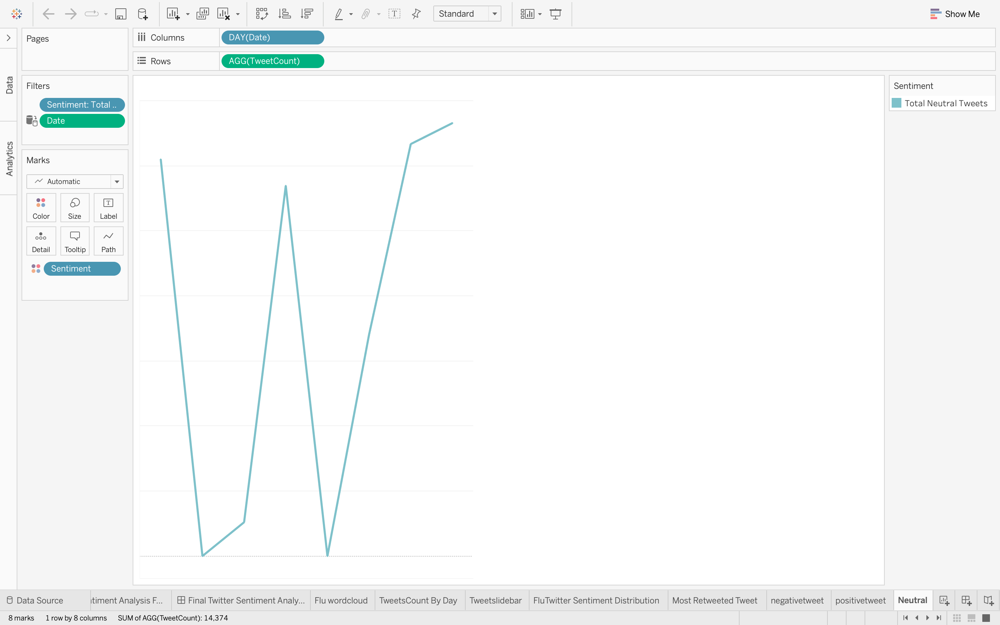

##### Finally,layout for dashboard has decided and configured all sheets together using horizontal and vertical containers.Also,added company logo,twitter logo which are inserted using image object from dashboard menu options.
- From the dashboard, you can visualize different outcomes and get more insights.These insights are not representative of the entire Twitter community because I only mined a subset of tweets for that period.
- At the end we leaned about how to grab the data from twitter,how to analyse these data and how to visualize with python as well as Tableau.
- [Twitter Sentiment Analysis For Flu Symptoms](https://public.tableau.com/app/profile/kirti6896/viz/TwitterSentimentAnalysis_16844225195090/FinalTwitterSentimentAnalysis?publish=yes)

#### References:
- https://analyticsindiamag.com/hands-on-guide-to-download-analyze-and-visualize-twitter-data/
- https://github.com/aswathi15/Sentiment-Analysis---Twitter/blob/master/Sentiment%20Analysis%20-%20Twitter.ipynb
- https://www.learnpythonwithrune.org/how-to-plot-locations-of-tweets-on-map-using-python-in-3-easy-steps/
- https://medium.com/@timothymugayi/7-ways-to-execute-scheduled-jobs-with-python-47d481d22b91
- https://docs.tweepy.org/en/stable/api.html#search-tweets
- https://towardsdatascience.com/the-year-2020-analyzing-twitter-users-reflections-using-nlp-3afdfdf2f68e
- https://www.youtube.com/watch?v=oAIubTqg-Kw
- https://towardsdatascience.com/transformations-on-a-json-file-using-pandas-eba831181a96
- https://devqa.io/python-parse-json/